In [ ]:
import os
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import cv2
%matplotlib widget
%load_ext autoreload
%autoreload 2
from amftrack.pipeline.functions.image_processing.extract_graph import (
    from_sparse_to_graph,
    generate_nx_graph,
    clean_degree_4,
)
import scipy
from amftrack.pipeline.functions.image_processing.node_id import remove_spurs
from amftrack.pipeline.functions.image_processing.extract_skel import remove_component, remove_holes
import numpy as np
from amftrack.pipeline.development.high_mag_videos.high_mag_videos_fun import *
from scipy import signal
from skimage.morphology import skeletonize
from amftrack.pipeline.functions.image_processing.extract_skel import (
    extract_skel_new_prince,
    run_back_sub,
    bowler_hat,
)
from scipy.interpolate import griddata
from PIL import Image
import pandas as pd
from scipy.optimize import curve_fit
plt.style.use('presentation.mplstyle')


In [ ]:
images_path = r"/mnt/sun/home-folder/Jaap/Transport setup 4 x NileRed/All frames"
images_path = r"/mnt/sun/home-folder/cargill/20221027_plate452/20221027_plate452_001"

# images_path = r"/mnt/sun/home-folder/cargill/20221109_Plate462/20221109_Plate462_103"
video_name = images_path.split('/')[-1]
kymos_path = '/'.join(images_path.split('/')[:-1]+["_".join((video_name,'kymos'))])
if not os.path.exists(kymos_path):
    os.mkdir(kymos_path)
files = os.listdir(images_path)
images_total_path = [os.path.join(images_path,file) for file in files]
images_total_path.sort()
fps = 5
time_pixel_size = 1/fps #s.pixel
binning = 2
magnification = 4
space_pixel_size = 2*1.725/(magnification)*binning #um.pixel

In [ ]:
selection_file = images_total_path
selection_file.sort()
begin  = 1
end = -1
image = imageio.imread(selection_file[end])
image2 = imageio.imread(selection_file[begin])
selection_file = selection_file[begin:end]

fig, ax = plt.subplots()
ax.imshow(image,cmap="gray")
ax.imshow(image2,alpha = 0.5)


/data/temp/ipykernel_1658303/1833114649.py:3: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(file) for file in selection_file[::10]]


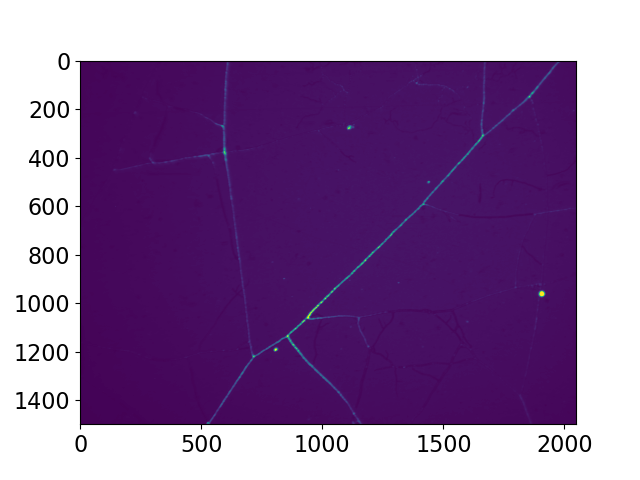

In [13]:
plt.close("all")
fig, ax = plt.subplots()
images = [imageio.imread(file) for file in selection_file[::10]]
images = [cv2.resize(image, np.flip(images[0].shape)) for image in images]
mean_proj = np.mean(np.array(images), axis=0)
# ax.imshow(mean_proj>10)
ax.imshow(mean_proj)

In [197]:
edge = (16,10)

slices, segments = extract_section_profiles_for_edge(
edge,
pos,
mean_proj,
nx_graph_pruned,
resolution=resolution,
offset=offset,
step=step,
target_length=target_length,
bound1=bound1,
bound2=bound2
)

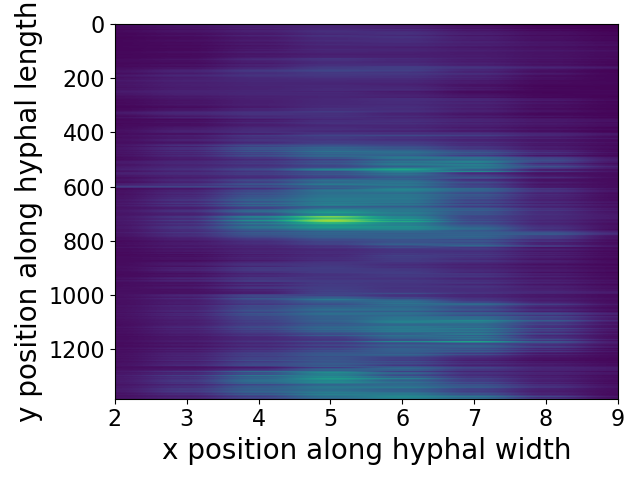

In [198]:
plt.close("all")
fig, ax = plt.subplots()
ax.imshow(slices,aspect='auto')
ax.set_xlim(2,9)
ax.set_xlabel('x position along hyphal width')
ax.set_ylabel('y position along hyphal length')
plt.tight_layout()

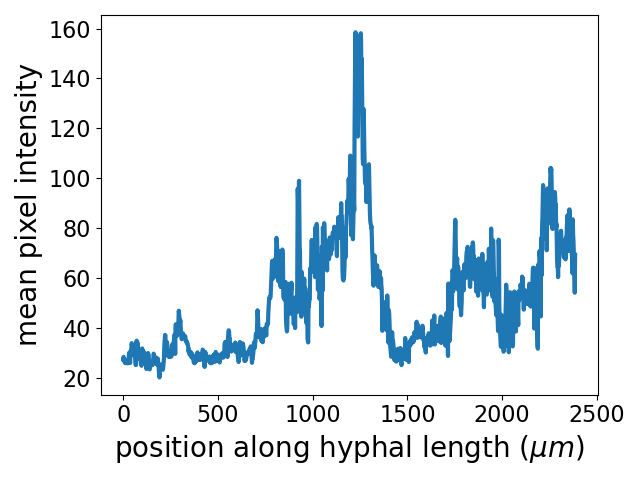

In [200]:
binning = 2
magnification = 4
space_pixel_size = 2*1.725/(magnification)*binning #um.pixel
fig, ax = plt.subplots()
ax.plot(np.array(range(slices.shape[0]))*space_pixel_size,slices[:,5])
ax.set_xlabel('position along hyphal length ($\mu m$)')
ax.set_ylabel('mean pixel intensity')
plt.tight_layout()

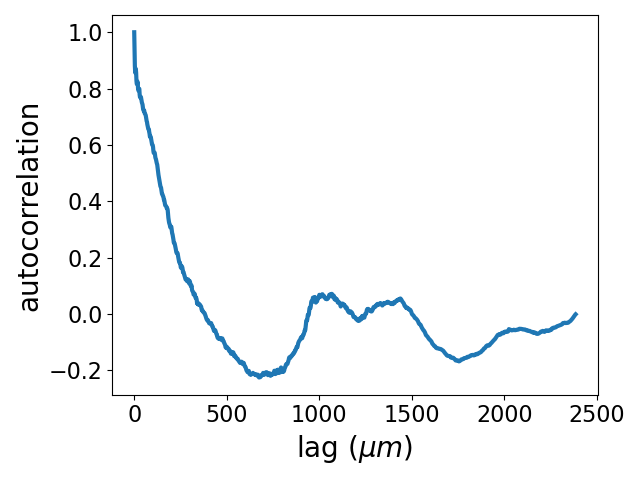

In [201]:
def autocorr(x):
    result = np.correlate(x, x, mode='full')
    return result[result.size // 2:]
y = slices[:,6]-np.mean(slices[:,6])
fig, ax = plt.subplots()
autoc = autocorr(y)
autoc = autoc/autoc.max()
lags = np.linspace(0.0, len(autoc)*space_pixel_size, len(autoc), endpoint=False)
ax.plot(lags,autoc, label = 'savgol filter')
ax.set_xlabel('lag ($\mu m$)')
ax.set_ylabel('autocorrelation')

plt.tight_layout()

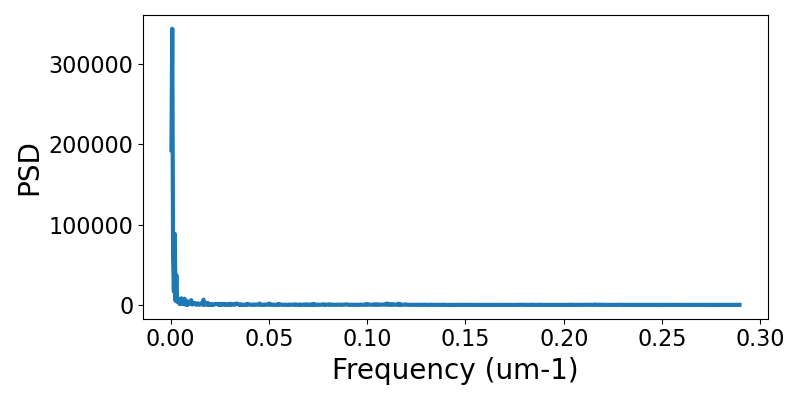

In [202]:
signal = y
frequ = 1/space_pixel_size
signal_ZMUV = (signal-np.nanmean(signal))/np.nanstd(signal)
s = signal_ZMUV
autoc = autocorr(s)
autoc = autoc/autoc.max()
speed_fft = np.fft.fft(s)
speed_psd = np.abs(speed_fft) ** 2
fftfreq = np.fft.fftfreq(len(speed_psd))
i = fftfreq > 0
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
ax.plot(frequ*fftfreq[i], speed_psd[i])
ax.set_xlabel('Frequency (um-1)')
ax.set_ylabel('PSD')
plt.tight_layout()

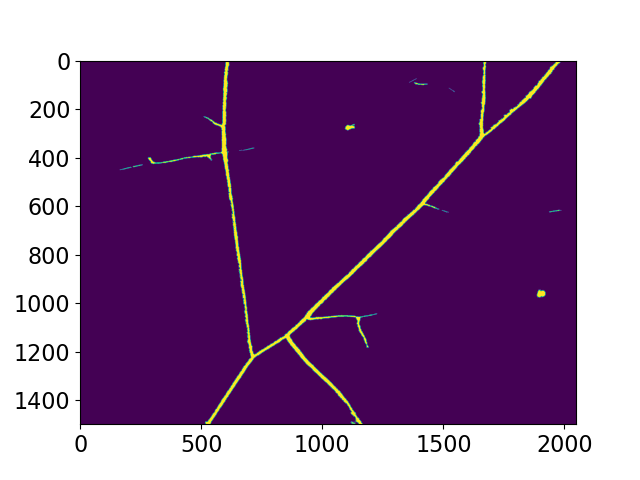

In [14]:
params = [30]
max_proj = np.max(np.array(images), axis=0)
segmented = bowler_hat(max_proj, 32, params)
fig, ax = plt.subplots()
ax.imshow(segmented)
thresh = 0.07
ax.imshow(segmented>thresh)

In [15]:
max_proj = np.max(np.array(images), axis=0)
segmented = bowler_hat(max_proj, 32, params)>thresh
segmented = remove_holes(segmented)
skeletonized = skeletonize(segmented)
skeleton = scipy.sparse.dok_matrix(skeletonized)
nx_graph, pos = generate_nx_graph(from_sparse_to_graph(skeleton))
nx_graph_pruned, pos = remove_spurs(nx_graph, pos, threshold=20)

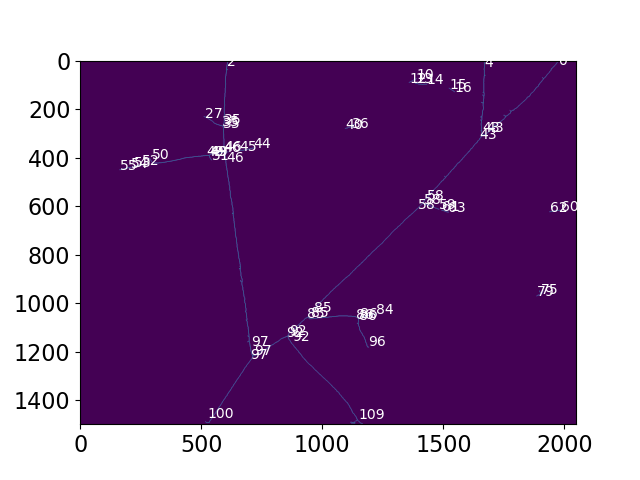

In [23]:
fig, ax = plt.subplots()
ax.imshow(skeletonized)
weight = 0.05
for edge in list(nx_graph_pruned.edges):
    ax.text(*np.flip((1-weight) * pos[edge[0]]+weight*pos[edge[1]]),str(edge[0]),color="white")
    ax.text(*np.flip((1-weight) * pos[edge[1]]+weight*pos[edge[0]]),str(edge[1]),color="white")

In [24]:
edges = [(100,97),(97,46),(46,35),(35,2),(97,92),(92,85),(85,58),(58,43),(43,0),(43,4),(92,109)]

In [18]:
def gauss(x, H, A, x0, sigma):
    return(H + A*np.exp(-(x-x0)**2/(2*sigma**2)))

In [25]:
weight = 0.05
bound1 = 0
bound2 = 1
offset=20
step=30
target_length=30
resolution = 1
widths = {}
for edge in edges:
    print(edge)
    slices, segments = extract_section_profiles_for_edge(
    edge,
    pos,
    mean_proj,
    nx_graph_pruned,
    resolution=resolution,
    offset=offset,
    step=step,
    target_length=target_length,
    bound1=bound1,
    bound2=bound2
)
    sigmas = []
    for slice_obj in slices:
        popt, pcov = curve_fit(gauss, np.array(range(len(slice_obj))),
                               slice_obj,p0 = [0,125,target_length/2,10],
                               bounds = ([-np.inf,0,0,0],[np.inf,np.inf,np.inf,np.inf]))
        sigmas.append(popt[3])
    widths[edge] = 2*np.median(sigmas)*space_pixel_size

(100, 97)
(97, 46)
(46, 35)
(35, 2)
(97, 92)
(92, 85)
(85, 58)
(58, 43)
(43, 0)
(43, 4)
(92, 109)


In [26]:
widths

{(100, 97): 7.64717514328729,
 (97, 46): 9.961493052295605,
 (46, 35): 11.767869273307339,
 (35, 2): 10.987064853890871,
 (97, 92): 6.466027227505749,
 (92, 85): 6.895372891207259,
 (85, 58): 7.169996529754008,
 (58, 43): 7.018570729407855,
 (43, 0): 7.700475525734891,
 (43, 4): 9.023138176784574,
 (92, 109): 8.937406906770601}

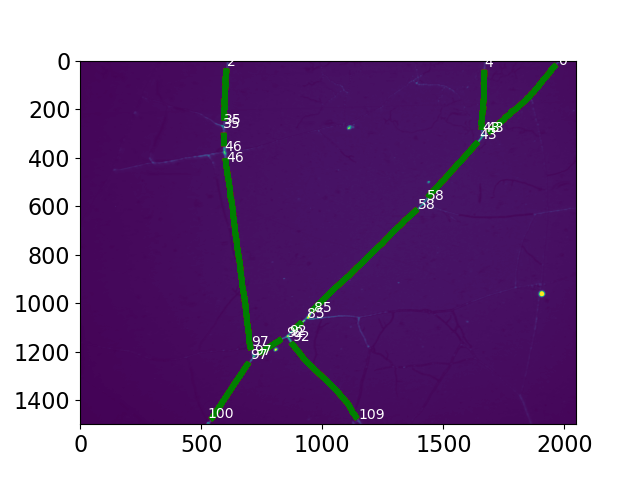

In [27]:
weight = 0.05

plt.close("all")
fig, ax = plt.subplots()
ax.imshow(mean_proj)
bound1 = 0
bound2 = 1
offset=20
step=30
target_length=10
resolution = 1
for edge in edges:
    slices, segments = extract_section_profiles_for_edge(
    edge,
    pos,
    image,
    nx_graph_pruned,
    resolution=resolution,
    offset=offset,
    step=step,
    target_length=target_length,
    bound1=bound1,
    bound2=bound2
)
    plot_segments_on_image(segments,ax)
    plot_segments_on_image(segments,ax,color="green", bound1=bound1,
    bound2=bound2)
    
    ax.text(*np.flip((1-weight) * pos[edge[0]]+weight*pos[edge[1]]),str(edge[0]),color="white")
    ax.text(*np.flip((1-weight) * pos[edge[1]]+weight*pos[edge[0]]),str(edge[1]),color="white")
save_path_temp = os.path.join(kymos_path, f"extraction.png")
plt.savefig(save_path_temp)

In [28]:
kymos = {edge:get_kymo(edge,pos,selection_file,nx_graph_pruned) for edge in edges}

In [29]:
for edge in kymos.keys():
    kymo = kymos[edge]
    save_path_temp = os.path.join(kymos_path, f"{edge}kymo.npy")
    np.save(save_path_temp,kymo)
    im = Image.fromarray(kymo.astype(np.uint8))
    save_path_temp = os.path.join(kymos_path, f"{edge}kymo.png")
    im.save(save_path_temp)

In [30]:
kymos = {}
for path in os.listdir(kymos_path):
    split = path.split(')')
    if split[-1]=='kymo.npy':
        edge = tuple([int(node.split('(')[-1]) for node in split[0].split(',')])
        kymos[edge]=np.load(os.path.join(kymos_path, path),allow_pickle=True)

In [31]:
filtered_kymos = {edge: filter_kymo(kymos[edge]) for edge in kymos.keys()}
speeds = {}

In [32]:
for edge in kymos.keys():
    for i in [0,1]:
        kymo = filtered_kymos[edge][i]
        suffix = 'right' if i==0 else "left"
        save_path_temp = os.path.join(kymos_path, f"{edge}kymo_{suffix}.npy")
        np.save(save_path_temp,kymo)
        im = Image.fromarray(((kymo-np.min(kymo))/np.max(kymo)*128).astype(np.uint8))
        save_path_temp = os.path.join(kymos_path, f"{edge}kymo_{suffix}.png")
        im.save(save_path_temp)

/data/temp/ipykernel_1658303/3161145228.py:34: RuntimeWarning: Mean of empty slice
  speeds = np.nanmean(speed,axis=1)
/home/ipausers/bisot/miniconda3/envs/amftrack/lib/python3.9/site-packages/numpy/core/fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)
/data/temp/ipykernel_1658303/3161145228.py:34: RuntimeWarning: Mean of empty slice
  speeds = np.nanmean(speed,axis=1)
/home/ipausers/bisot/miniconda3/envs/amftrack/lib/python3.9/site-packages/numpy/core/fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=o

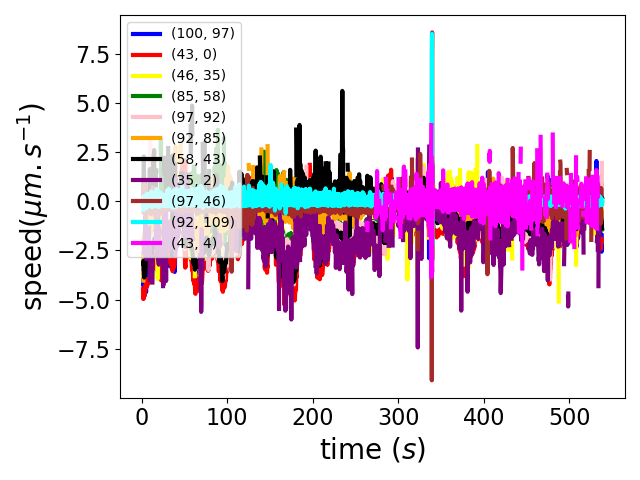

In [42]:
fig, ax = plt.subplots()
colors = ['blue','red','yellow','green','pink','orange','black','purple','brown','cyan','magenta']
speed_dataframe = pd.DataFrame()
for j,edge in enumerate(kymos.keys()):
    color = colors[j]
    for i in [0,1]:
        kymo = filter_kymo(kymos[edge])[i]
        


        W = int(5/space_pixel_size)          # window size is WxW
        W = 3
        C_Thr = 0.95
        imgCoherency, imgOrientation = calcGST(kymo, W)
        nans = np.empty(imgOrientation.shape)
        nans.fill(np.nan)
        real_movement = np.where(imgCoherency>C_Thr,imgOrientation,nans)
        speed=np.tan((real_movement-90)/180*np.pi)*space_pixel_size/time_pixel_size #um.s-1
        nans = np.empty(speed.shape)
        nans.fill(np.nan)
        speed = np.where(speed<20,speed,nans)
        nans = np.empty(speed.shape)
        nans.fill(np.nan)
        speed = np.where(speed>-20,speed,nans)
        # # ax.imshow((imgCoherency))
        klen = 25
        kernel = np.ones((klen,klen))/klen**2
        z1 = scipy.signal.convolve2d(imgCoherency, kernel,mode = "same")
        nans = np.empty(speed.shape)
        nans.fill(np.nan)
        speed = np.where(z1>0.8,speed,nans)
        label =edge if i==0 else None
        times = np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size
        speeds = np.nanmean(speed,axis=1)
        edges_list = [edge for k in range(len(speeds))]
        widths_list = [widths[edge] for k in range(len(speeds))]
        direction = ["root" if i==0 else 'tip' for k in range(len(speeds))]
        data = pd.DataFrame(np.transpose((times,speeds,edges_list,direction,widths_list)),
                     columns = ['time (s)','speed (um.s-1)','edge','direction','width'])
        speed_dataframe = pd.concat((speed_dataframe,data))
        ax.plot(times,speeds,label =edge if i==0 else None,color = color)
        ax.set_ylabel('speed($\mu m.s^{-1}$)')
        ax.set_xlabel('time ($s$)')
save_path_temp = os.path.join(kymos_path, f"speed_data.csv")
speed_dataframe.to_csv(save_path_temp)
plt.legend()
plt.tight_layout()

/data/temp/ipykernel_1658303/3320158325.py:30: RuntimeWarning: Mean of empty slice
  speeds = np.nanmean(speed,axis=1)
/home/ipausers/bisot/miniconda3/envs/amftrack/lib/python3.9/site-packages/numpy/core/fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)
/data/temp/ipykernel_1658303/3320158325.py:30: RuntimeWarning: Mean of empty slice
  speeds = np.nanmean(speed,axis=1)
/home/ipausers/bisot/miniconda3/envs/amftrack/lib/python3.9/site-packages/numpy/core/fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=o

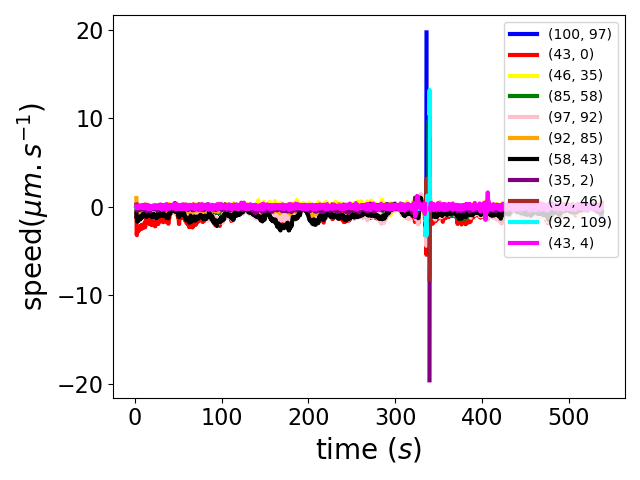

In [41]:
fig, ax = plt.subplots()
colors = ['blue','red','yellow','green','pink','orange','black','purple','brown','cyan','magenta']
speed_dataframe = pd.DataFrame()
for j,edge in enumerate(kymos.keys()):
    color = colors[j]
    kymo = kymos[edge]
    W = int(5/space_pixel_size)          # window size is WxW
    W = 3
    C_Thr = 0.95
    imgCoherency, imgOrientation = calcGST(kymo, W)
    nans = np.empty(imgOrientation.shape)
    nans.fill(np.nan)
    real_movement = np.where(imgCoherency>C_Thr,imgOrientation,nans)
    speed=np.tan((real_movement-90)/180*np.pi)*space_pixel_size/time_pixel_size #um.s-1
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed<20,speed,nans)
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed>-20,speed,nans)
    # # ax.imshow((imgCoherency))
    klen = 25
    kernel = np.ones((klen,klen))/klen**2
    z1 = scipy.signal.convolve2d(imgCoherency, kernel,mode = "same")
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(z1>0.8,speed,nans)
    label =edge if i==0 else None
    times = np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size
    speeds = np.nanmean(speed,axis=1)
    edges_list = [edge for k in range(len(speeds))]
    widths_list = [widths[edge] for k in range(len(speeds))]
    data = pd.DataFrame(np.transpose((times,speeds,edges_list,widths_list)),
                 columns = ['time (s)','speed (um.s-1)','edge','width'])
    speed_dataframe = pd.concat((speed_dataframe,data))
    ax.plot(times,speeds,label = edge,color = color)
    ax.set_ylabel('speed($\mu m.s^{-1}$)')
    ax.set_xlabel('time ($s$)')
save_path_temp = os.path.join(kymos_path, f"speed_data_no_direction.csv")
speed_dataframe.to_csv(save_path_temp)
plt.legend()
plt.tight_layout()
plt.legend()
plt.tight_layout()

/data/temp/ipykernel_1267318/122305187.py:38: RuntimeWarning: Mean of empty slice
  speeds = np.nanmean(speed,axis=1)
/home/ipausers/bisot/miniconda3/envs/amftrack/lib/python3.9/site-packages/numpy/core/fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)
/data/temp/ipykernel_1267318/122305187.py:38: RuntimeWarning: Mean of empty slice
  speeds = np.nanmean(speed,axis=1)
/home/ipausers/bisot/miniconda3/envs/amftrack/lib/python3.9/site-packages/numpy/core/fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=obj

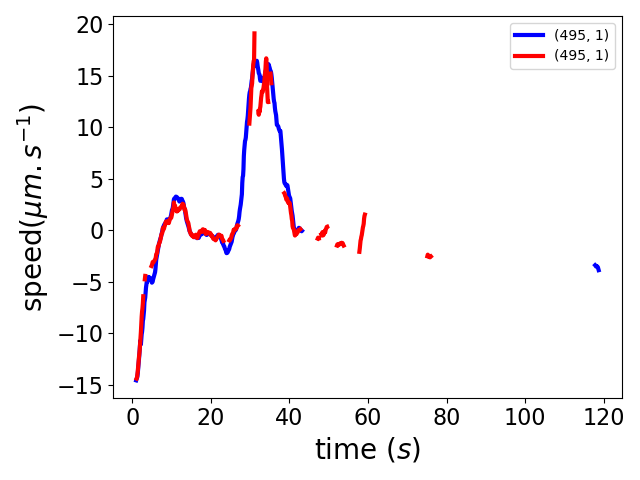

In [346]:
fig, ax = plt.subplots()
colors = ['blue','red','yellow','green','pink','orange','black','purple','brown','cyan','magenta']
speed_dataframe = pd.DataFrame()
for j,sliced in enumerate([(300,500),(2000,2200)]):
    color = colors[j]
    begin,end = sliced
    kymo = kymos[edge][:,begin:end]


    fps = 10
    time_pixel_size = 1/fps #s.pixel
    binning = 1
    magnification = 4
    space_pixel_size = 2*1.725/(magnification)*binning #um.pixel
    W = int(5/space_pixel_size)          # window size is WxW
    W = 15
    C_Thr = 0.80
    imgCoherency, imgOrientation = calcGST(kymo, W)
    nans = np.empty(imgOrientation.shape)
    nans.fill(np.nan)
    real_movement = np.where(imgCoherency>C_Thr,imgOrientation,nans)
    speed=np.tan((real_movement-90)/180*np.pi)*space_pixel_size/time_pixel_size #um.s-1
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed<150,speed,nans)
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed>-150,speed,nans)
    # # ax.imshow((imgCoherency))
    klen = 25
    kernel = np.ones((klen,klen))/klen**2
    z1 = scipy.signal.convolve2d(imgCoherency, kernel,mode = "same")
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(z1>0.8,speed,nans)
    label =edge if i==0 else None
    times = np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size
    speeds = np.nanmean(speed,axis=1)
    edges_list = [edge for k in range(len(speeds))]
    data = pd.DataFrame(np.transpose((times,speeds,edges_list)),
                 columns = ['time (s)','speed (um.s-1)','edge'])
    speed_dataframe = pd.concat((speed_dataframe,data))
    ax.plot(times,speeds,label = edge,color = color)
    ax.set_ylabel('speed($\mu m.s^{-1}$)')
    ax.set_xlabel('time ($s$)')
# save_path_temp = os.path.join(kymos_path, f"speed_data_no_direction.csv")
# speed_dataframe.to_csv(save_path_temp)
plt.legend()
plt.tight_layout()
plt.legend()
plt.tight_layout()

Text(0, 0.5, 'time')

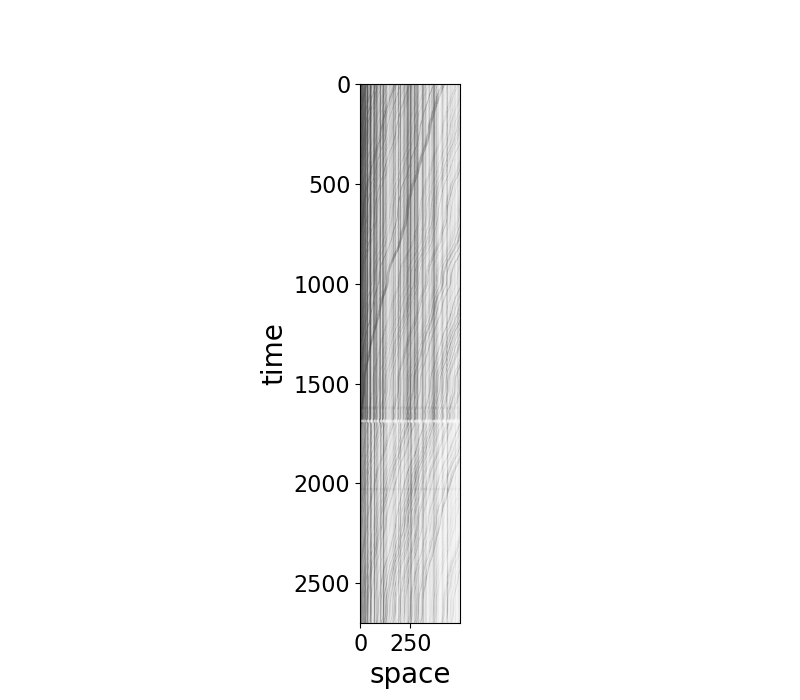

In [48]:
edge = 85,58
fig,ax = plt.subplots(figsize = (8,7))
# fig,ax = plt.subplots()

ax.imshow(kymos[edge],cmap='Greys')
ax.set_xlabel('space',size =20)
ax.set_ylabel('time',size =20)


# ax.imshow(filter_kymo(kymos[edge])[0],cmap='Reds',alpha = 0.3)

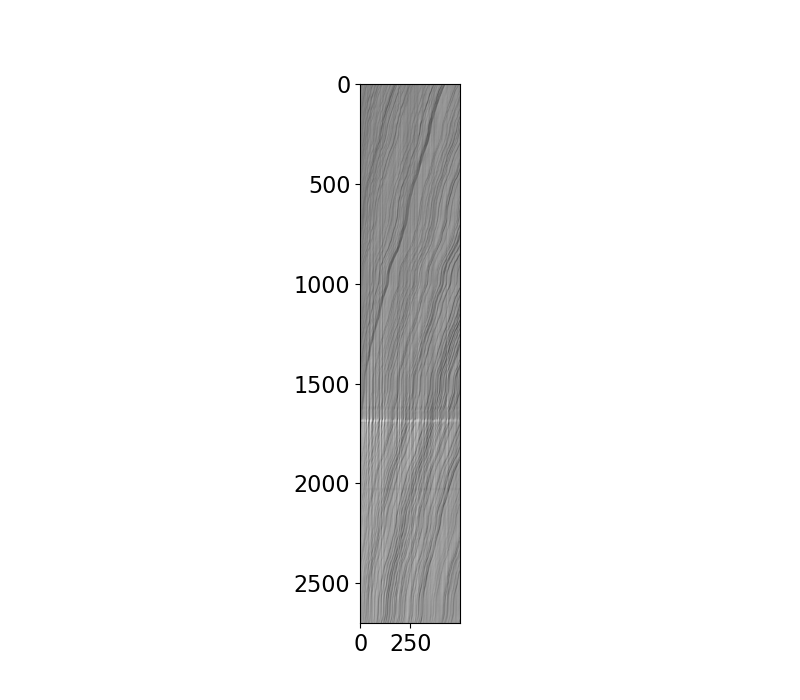

In [49]:
fig,ax = plt.subplots(figsize = (8,7))
ax.imshow(filter_kymo(kymos[edge])[0],cmap='Greys')

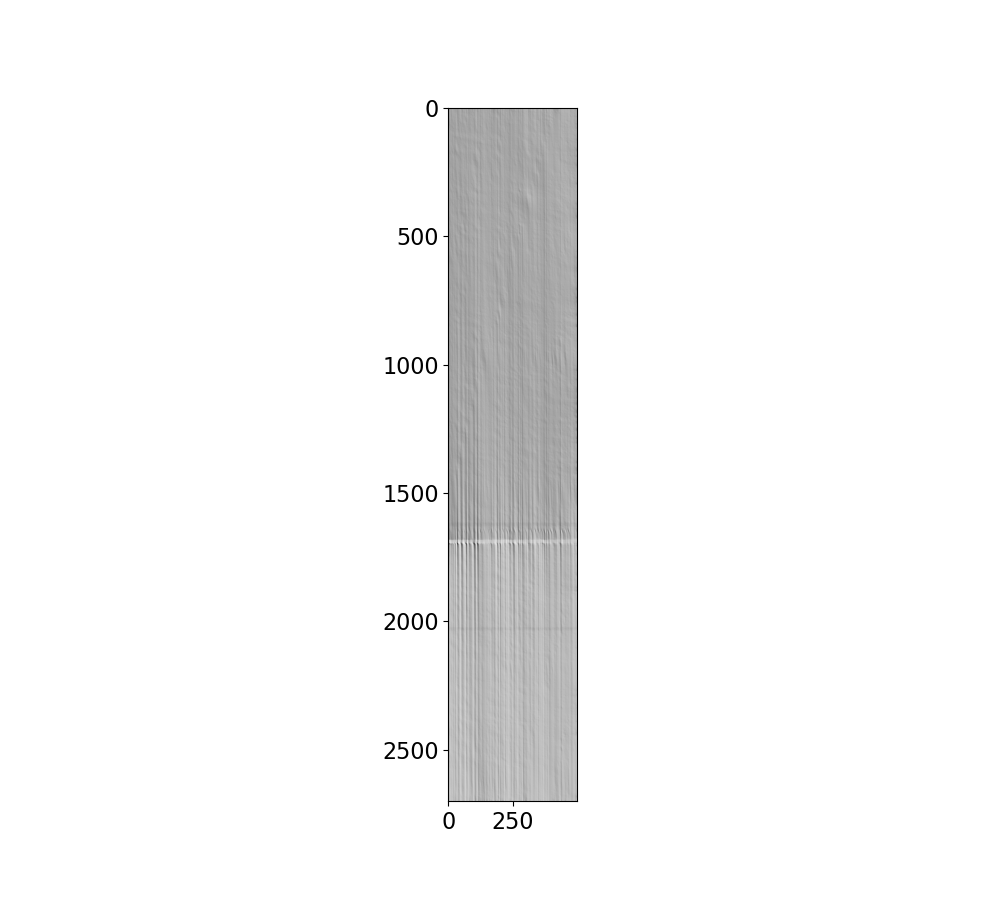

In [50]:
fig,ax = plt.subplots(figsize = (10,9))
ax.imshow(filter_kymo(kymos[edge])[1],cmap='Greys')

3


/data/temp/ipykernel_1658303/3915301932.py:75: RuntimeWarning: Mean of empty slice
  ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1))


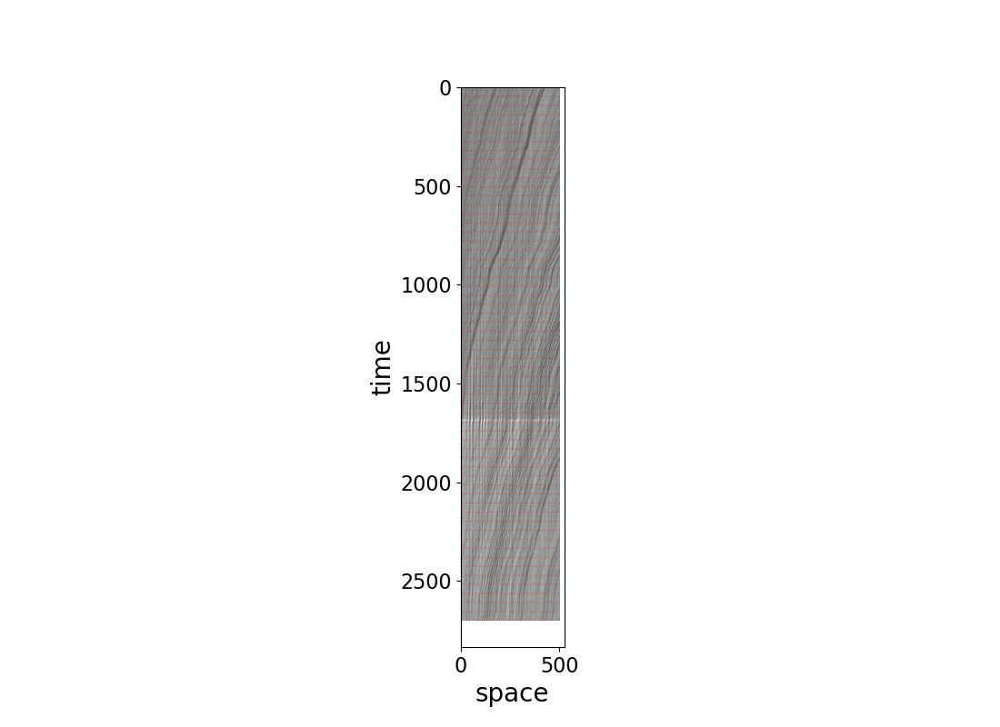

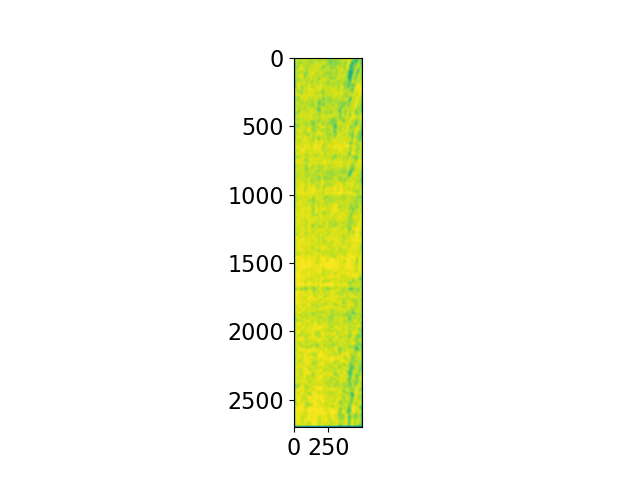

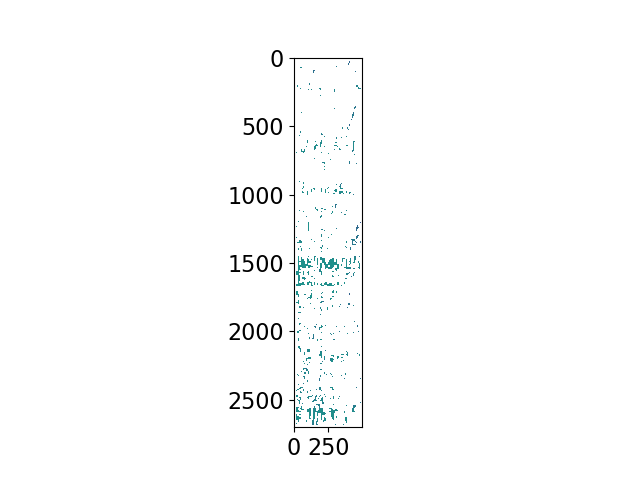

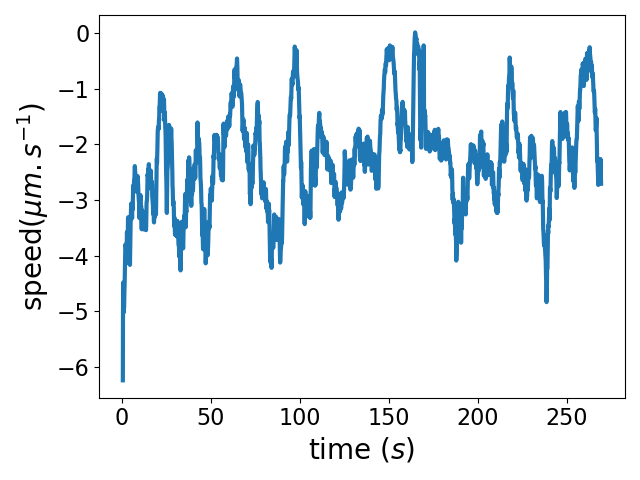

In [ ]:
fig, ax = plt.subplots(figsize=(11,8))
kymo = filter_kymo(kymos[edge])[0]
ax.imshow(kymo,cmap="Greys")

fps = 10
time_pixel_size = 1/fps #s.pixel
binning = 2
magnification = 4
space_pixel_size = 2*1.725/(magnification)*binning #um.pixel
W = int(5/space_pixel_size)          # window size is WxW
W = 3
print(W)
C_Thr = 0.85
imgCoherency, imgOrientation = calcGST(kymo, W)
nans = np.empty(imgOrientation.shape)
nans.fill(np.nan)

real_movement = np.where(imgCoherency>C_Thr,imgOrientation,nans)
speed=np.tan((real_movement-90)/180*np.pi)*space_pixel_size/time_pixel_size #um.s-1

a= speed
x, y = np.indices(a.shape)
interp = a
interp[np.isnan(interp)] = griddata(
    (x[~np.isnan(a)], y[~np.isnan(a)]), # points we know
    a[~np.isnan(a)],                    # values we know
    (x[np.isnan(a)], y[np.isnan(a)]))   # points to interpolate
speed = interp
a= speed
x, y = np.indices(a.shape)
interp = a
interp[np.isnan(interp)] = griddata(
    (x[~np.isnan(a)], y[~np.isnan(a)]), # points we know
    a[~np.isnan(a)],                    # values we know
    (x[np.isnan(a)], y[np.isnan(a)]),method='nearest')   # points to interpolate
klen = 50
kernel = np.ones((klen,klen))/klen**2


z1 = scipy.signal.convolve2d(interp, kernel)
grid_size = 60
x,y = np.meshgrid(np.linspace(0,kymo.shape[1],grid_size),np.linspace(0,kymo.shape[0],grid_size))
shape  = speed.shape
speed_reduced = z1[::shape[0]//grid_size,::shape[1]//grid_size]
speed_reduced = 1/(speed_reduced/(space_pixel_size/time_pixel_size))
norm = 100
v = -norm * speed_reduced/(np.sqrt(1+speed_reduced**2))
u = norm/(np.sqrt(1+speed_reduced**2))
u = u[:grid_size,:grid_size]
v = v[:grid_size,:grid_size]
ax.quiver(x,y,u,v,pivot = "mid",color="red")
ax.set_xlabel('space')
ax.set_ylabel('time')
fig, ax = plt.subplots()

speed=np.tan((real_movement-90)/180*np.pi)*space_pixel_size/time_pixel_size #um.s-1

nans = np.empty(speed.shape)
nans.fill(np.nan)
speed = np.where(speed<20,speed,nans)
nans = np.empty(speed.shape)
nans.fill(np.nan)
speed = np.where(speed>-20,speed,nans)
klen = 25
kernel = np.ones((klen,klen))/klen**2
z1 = scipy.signal.convolve2d(imgCoherency, kernel,mode = "same")
ax.imshow(z1)

nans = np.empty(speed.shape)
nans.fill(np.nan)
speed = np.where(z1>0.75,speed,nans)
fig, ax = plt.subplots()
ax.imshow(speed)
fig, ax = plt.subplots()
ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1))
ax.set_ylabel('speed($\mu m.s^{-1}$)')
ax.set_xlabel('time ($s$)')
plt.tight_layout()

/data/temp/ipykernel_1267874/715099330.py:33: RuntimeWarning: Mean of empty slice
  ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1))
/data/temp/ipykernel_1267874/715099330.py:33: RuntimeWarning: Mean of empty slice
  ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1))


(-6.5, 6.5)

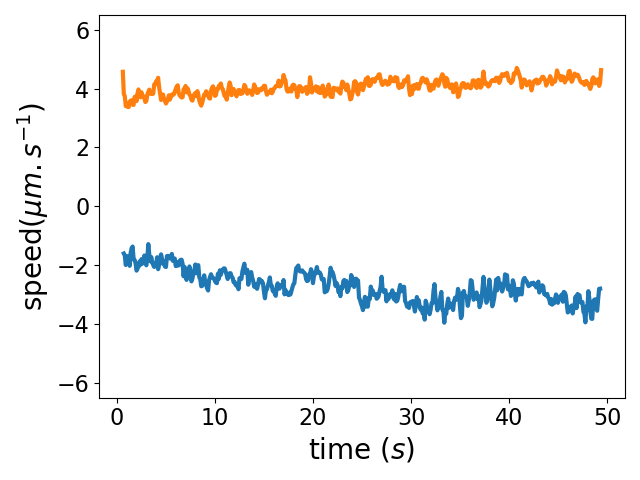

In [20]:
fig, ax = plt.subplots()

for i in [0,1]:   
    kymo = filter_kymo(kymos[edge])[i]


    fps = 10
    time_pixel_size = 1/fps #s.pixel
    binning = 2
    magnification = 4
    space_pixel_size = 2*1.725/(magnification)*binning #um.pixel
    W = int(5/space_pixel_size)          # window size is WxW
    W = 3
    C_Thr = 0.95
    imgCoherency, imgOrientation = calcGST(kymo, W)
    nans = np.empty(imgOrientation.shape)
    nans.fill(np.nan)
    real_movement = np.where(imgCoherency>C_Thr,imgOrientation,nans)
    speed=np.tan((real_movement-90)/180*np.pi)*space_pixel_size/time_pixel_size #um.s-1
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed<20,speed,nans)
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed>-20,speed,nans)
    # # ax.imshow((imgCoherency))
    klen = 25
    kernel = np.ones((klen,klen))/klen**2
    z1 = scipy.signal.convolve2d(imgCoherency, kernel,mode = "same")
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(z1>0.7,speed,nans)
    ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1))
    ax.set_ylabel('speed($\mu m.s^{-1}$)')
    ax.set_xlabel('time ($s$)')
plt.tight_layout()
ax.set_ylim(-6.5,6.5)

/data/temp/ipykernel_798821/3682870211.py:34: RuntimeWarning: Mean of empty slice
  ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1),label =edge)
/data/temp/ipykernel_798821/3682870211.py:34: RuntimeWarning: Mean of empty slice
  ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1),label =edge)


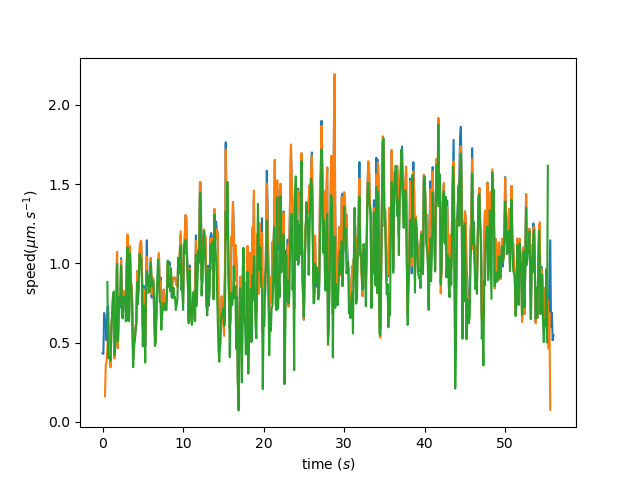

In [139]:
fig, ax = plt.subplots()

edge = 19,11
for thresh in [0.2,0.6,0.7]:
    kymo = filter_kymo(kymos[edge])[1]


    fps = 10
    time_pixel_size = 1/fps #s.pixel
    binning = 2
    magnification = 4
    space_pixel_size = 2*1.725/(magnification)*binning #um.pixel
    W = int(5/space_pixel_size)          # window size is WxW
    W = 3
    C_Thr = 0.95
    imgCoherency, imgOrientation = calcGST(kymo, W)
    nans = np.empty(imgOrientation.shape)
    nans.fill(np.nan)
    real_movement = np.where(imgCoherency>C_Thr,imgOrientation,nans)
    speed=np.tan((real_movement-90)/180*np.pi)*space_pixel_size/time_pixel_size #um.s-1
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed<20,speed,nans)
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed>-20,speed,nans)
    # # ax.imshow((imgCoherency))
    klen = 25
    kernel = np.ones((klen,klen))/klen**2
    z1 = scipy.signal.convolve2d(imgCoherency, kernel,mode = "same")
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(z1>thresh,speed,nans)
    ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1),label =edge)
    ax.set_ylabel('speed($\mu m.s^{-1}$)')
    ax.set_xlabel('time ($s$)')

/data/temp/ipykernel_798821/2390816641.py:34: RuntimeWarning: Mean of empty slice
  ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1),label =edge)
/data/temp/ipykernel_798821/2390816641.py:34: RuntimeWarning: Mean of empty slice
  ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1),label =edge)
/data/temp/ipykernel_798821/2390816641.py:34: RuntimeWarning: Mean of empty slice
  ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1),label =edge)


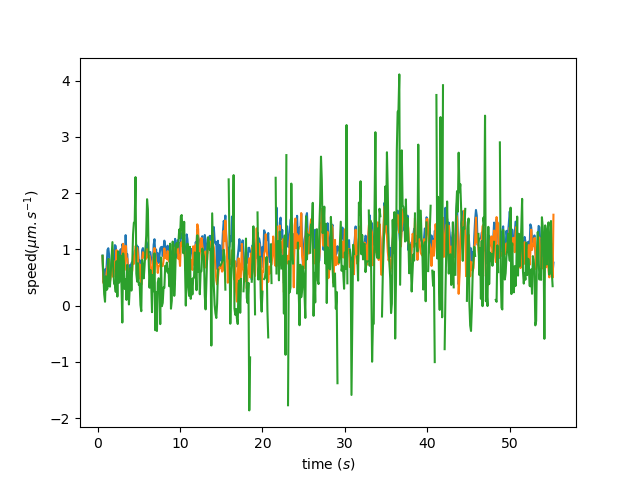

In [140]:
fig, ax = plt.subplots()

edge = 19,11
for thresh in [0.9,0.95,0.99]:
    kymo = filter_kymo(kymos[edge])[1]


    fps = 10
    time_pixel_size = 1/fps #s.pixel
    binning = 2
    magnification = 4
    space_pixel_size = 2*1.725/(magnification)*binning #um.pixel
    W = int(5/space_pixel_size)          # window size is WxW
    W = 3
    C_Thr = thresh
    imgCoherency, imgOrientation = calcGST(kymo, W)
    nans = np.empty(imgOrientation.shape)
    nans.fill(np.nan)
    real_movement = np.where(imgCoherency>C_Thr,imgOrientation,nans)
    speed=np.tan((real_movement-90)/180*np.pi)*space_pixel_size/time_pixel_size #um.s-1
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed<20,speed,nans)
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed>-20,speed,nans)
    # # ax.imshow((imgCoherency))
    klen = 25
    kernel = np.ones((klen,klen))/klen**2
    z1 = scipy.signal.convolve2d(imgCoherency, kernel,mode = "same")
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(z1>0.7,speed,nans)
    ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1),label =edge)
    ax.set_ylabel('speed($\mu m.s^{-1}$)')
    ax.set_xlabel('time ($s$)')

In [292]:
import math
def gridplot(
    n: int,
    ncols = None,
    subw: float = 4.0,
    subh: float = 4.0,
    **kwargs,
):
    if ncols is None:
        ncols = n
    nrows = math.ceil(n / ncols)
    figsize = (subw * ncols, subh * nrows)
    fig, axs = plt.subplots(nrows, ncols, figsize=figsize, **kwargs)
    return fig, iter(axs.flatten())

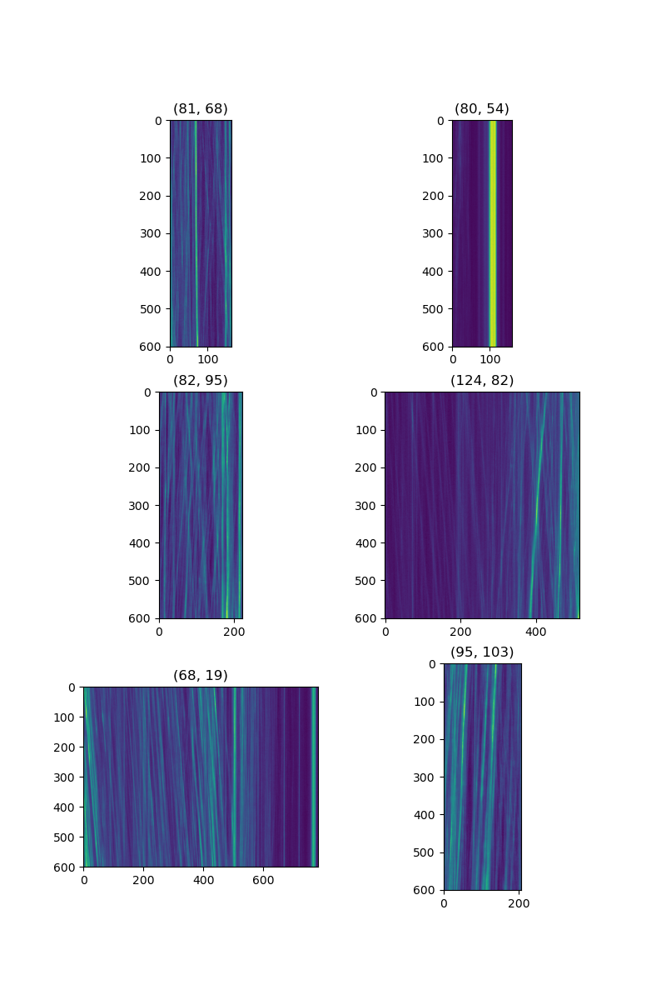

In [293]:
fig,axs = gridplot(len(kymos),ncols = 2)
for i,ax in enumerate(axs):
    ax.imshow(kymos[edges[i]])
    ax.set_title(str(edges[i]))

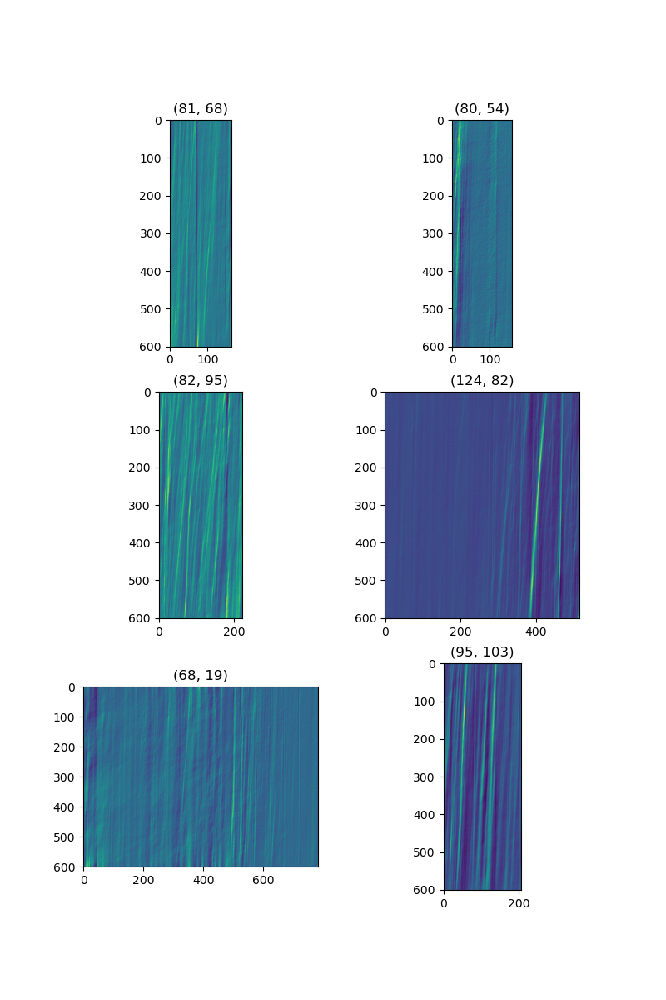

In [294]:
fig,axs = gridplot(len(kymos),ncols = 2)
for i,ax in enumerate(axs):
    ax.imshow(filtered_kymos[edges[i]][0])
    ax.set_title(str(edges[i]))

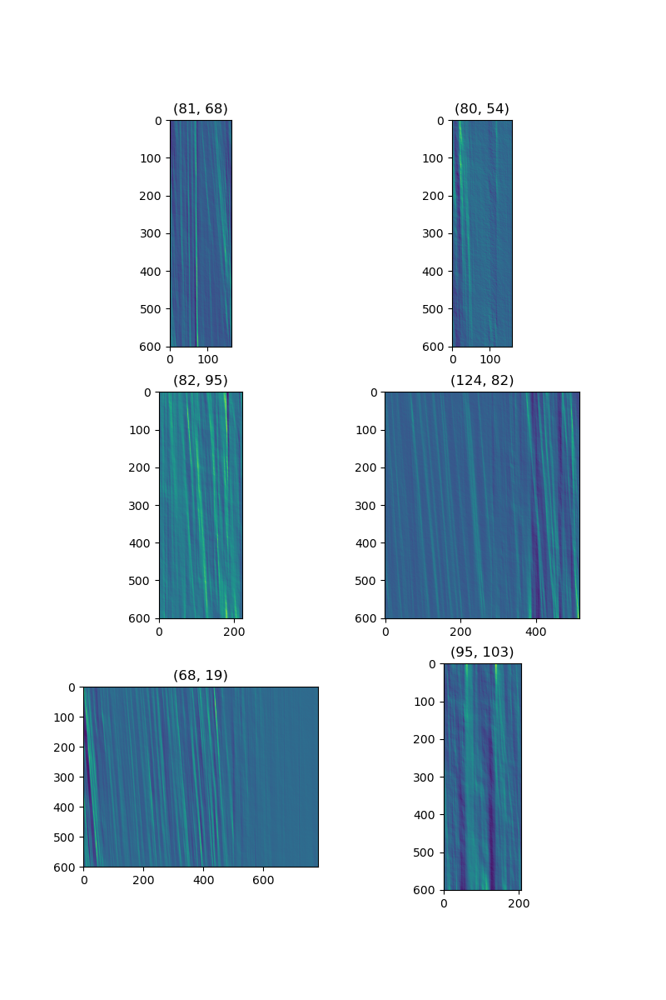

In [299]:
fig,axs = gridplot(len(kymos),ncols = 2)
for i,ax in enumerate(axs):
    ax.imshow(filtered_kymos[edges[i]][1])
    ax.set_title(str(edges[i]))

Text(0.5, 0, 'time ($s$)')

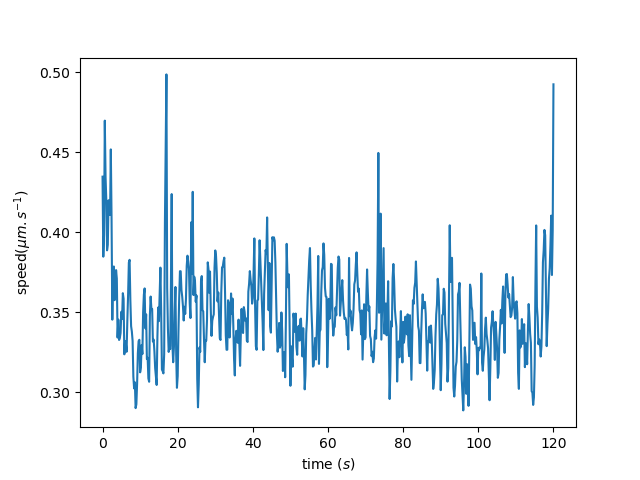

In [304]:
fig, ax = plt.subplots()
speed = speeds_right[(68,19)]
ax.plot(np.array(range(len(np.mean(speed,axis=1))))*time_pixel_size,np.nanmean(speed,axis=1))
ax.set_ylabel('speed($\mu m.s^{-1}$)')
ax.set_xlabel('time ($s$)')

In [306]:

speeds_left = {}
speeds_right = {}

for edge in edges:
    imgCoherency, imgOrientation = calcGST(filtered_kymos[edge][0], W)
    nans = np.empty(imgOrientation.shape)
    nans.fill(np.nan)
    real_movement = np.where(imgCoherency>C_Thr,imgOrientation,nans)
    speed=np.tan((real_movement-90)/180*np.pi)*space_pixel_size/time_pixel_size #um.s-1
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed<20,speed,nans)
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed>-20,speed,nans)
    speeds_left[edge]=speed
    imgCoherency, imgOrientation = calcGST(filtered_kymos[edge][1], W)
    nans = np.empty(imgOrientation.shape)
    nans.fill(np.nan)
    real_movement = np.where(imgCoherency>C_Thr,imgOrientation,nans)
    speed=np.tan((real_movement-90)/180*np.pi)*space_pixel_size/time_pixel_size #um.s-1
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed<20,speed,nans)
    nans = np.empty(speed.shape)
    nans.fill(np.nan)
    speed = np.where(speed>-20,speed,nans)
    speeds_right[edge]=speed
    # speeds[edge]=speeds[edge][:,:300]


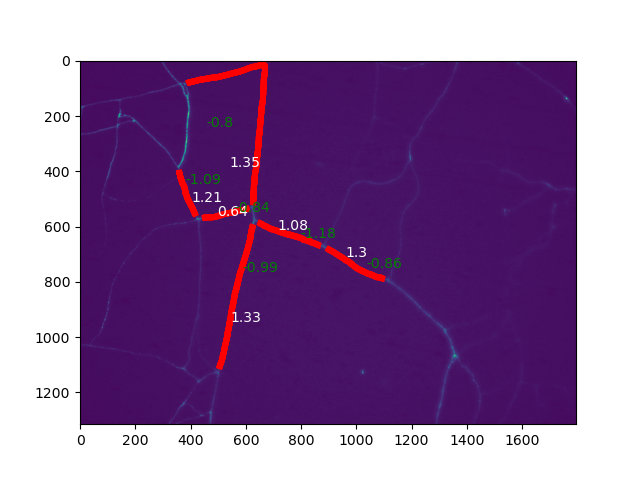

In [315]:
fig, ax = plt.subplots()
ax.imshow(image)
for edge in edges:
    slices, segments = extract_section_profiles_for_edge(
    edge,
    pos,
    image,
    nx_graph_pruned,
    resolution=1,
    offset=4,
    step=15,
    target_length=10,
)
    plot_segments_on_image(segments,ax)
    mean_speed_right = np.nanmedian(speeds_right[edge])
    mean_speed_right = round(mean_speed_right,2)
    pos_plot = np.flip(np.average([pos[edge[0]],pos[edge[1]]],axis=0,weights = (2,1)))
    ax.text(*pos_plot,mean_speed_right,color="white")
    mean_speed_left = np.nanmedian(speeds_left[edge])
    mean_speed_left = round(mean_speed_left,2)
    pos_plot = np.flip(np.average([pos[edge[0]],pos[edge[1]]],axis=0,weights = (1,2)))
    ax.text(*pos_plot,mean_speed_left,color="green")

In [116]:
corrs = {}
for edge in edges:
    to_treat = (speeds[edge]-np.mean(speeds[edge]))/np.std(speeds[edge])
    corr = signal.correlate2d(to_treat, to_treat)
    corrs[edge]=corr/np.max(corr)

In [65]:
1.725/2

0.8625

In [ ]:
fig, ax = plt.subplots()
ax.imshow(kymos[(63,40)],cmap="Greys")
time_pixel_size = 0.20 #s.pixel
space_pixel_size = 1.725/2 #um.pixel
W = 20          # window size is WxW
C_Thr = 0.8
imgCoherency, imgOrientation = calcGST(kymos[(63,40)], W)
fig, ax = plt.subplots()

ax.imshow(imgCoherency)
nans = np.empty(imgOrientation.shape)
nans.fill(np.nan)
real_movement = np.where(imgCoherency>C_Thr,imgOrientation,nans)
speed=np.tan((real_movement-90)/180*np.pi)*space_pixel_size/time_pixel_size #um.s-1
nans = np.empty(speed.shape)
nans.fill(np.nan)
speed = np.where(speed<20,speed,nans)
nans = np.empty(speed.shape)
nans.fill(np.nan)
speed = np.where(speed>-20,speed,nans)
fig, ax = plt.subplots()

ax.imshow(-speed)
# ax.imshow((imgCoherency))


In [ ]:
from scipy.interpolate import griddata
a= speed
x, y = np.indices(a.shape)
interp = a
interp[np.isnan(interp)] = griddata(
    (x[~np.isnan(a)], y[~np.isnan(a)]), # points we know
    a[~np.isnan(a)],                    # values we know
    (x[np.isnan(a)], y[np.isnan(a)]))   # points to interpolate
fig, ax = plt.subplots()

ax.imshow(interp)
speed = interp
a= speed
x, y = np.indices(a.shape)
interp = a
interp[np.isnan(interp)] = griddata(
    (x[~np.isnan(a)], y[~np.isnan(a)]), # points we know
    a[~np.isnan(a)],                    # values we know
    (x[np.isnan(a)], y[np.isnan(a)]),method='nearest')   # points to interpolate
fig, ax = plt.subplots()

ax.imshow(interp)
speed = interp

In [ ]:
to_treat = (speed-np.mean(speed))/np.std(speed)
corr = signal.correlate(to_treat, to_treat)

In [ ]:
fig, ax = plt.subplots()

ax.imshow(corr)

In [ ]:
1

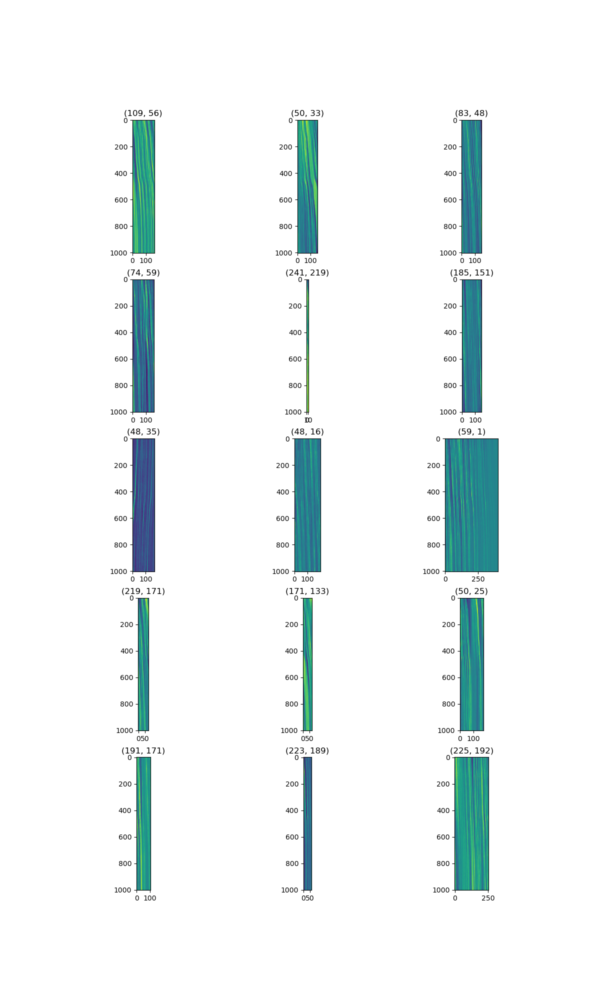

In [119]:
fig,axs = gridplot(len(kymos),ncols = 3)
for i,ax in enumerate(axs):
    ax.imshow(filtered_kymos[edges[i]][1])
    ax.set_title(str(edges[i]))

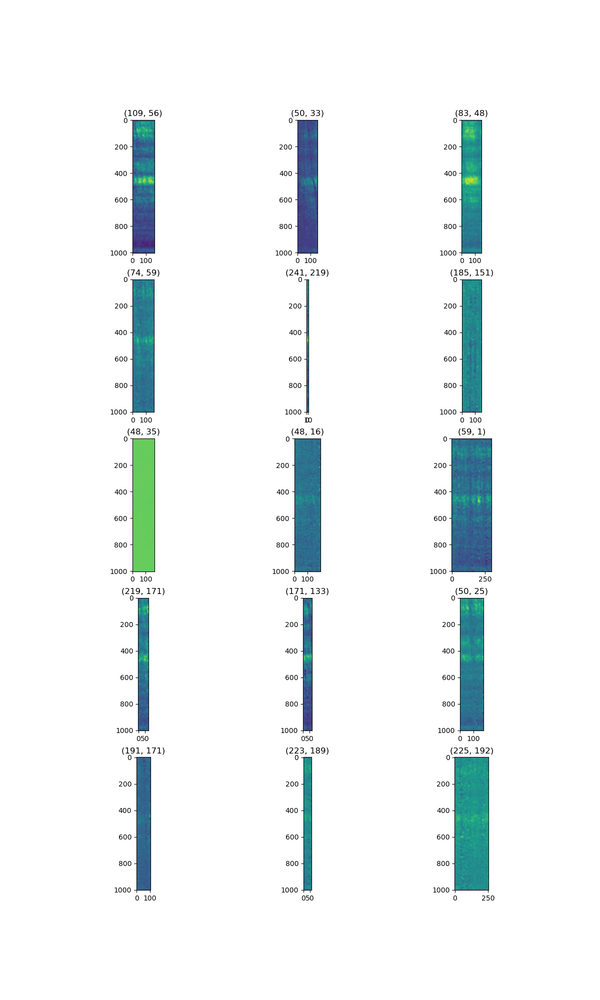

In [120]:
fig,axs = gridplot(len(kymos),ncols = 3)
for i,ax in enumerate(axs):
    ax.imshow(speeds[edges[i]])
    ax.set_title(str(edges[i]))

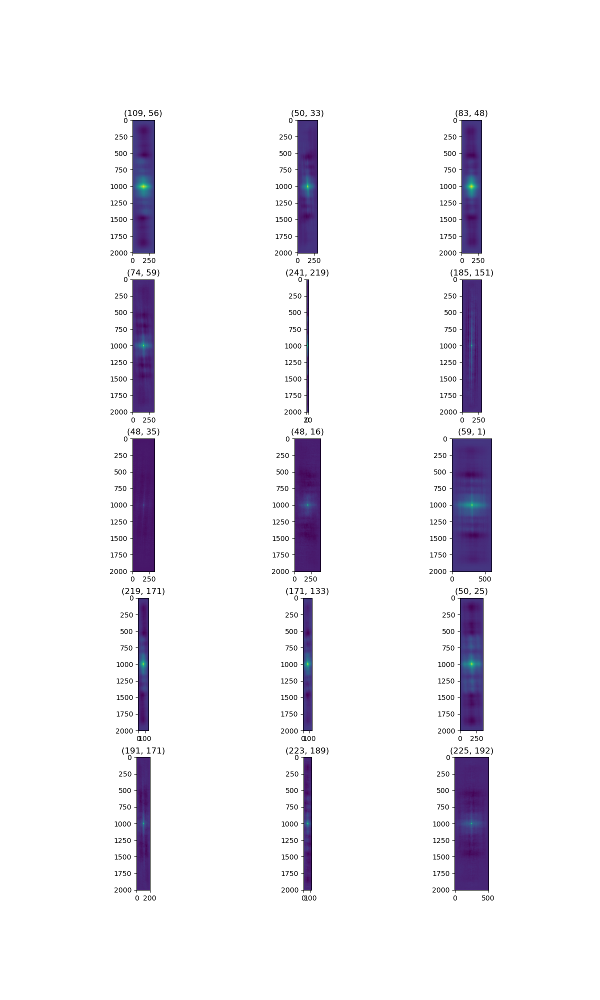

In [121]:
fig,axs = gridplot(len(kymos),ncols = 3)
for i,ax in enumerate(axs):
    ax.imshow(corrs[edges[i]])
    ax.set_title(str(edges[i]))

In [20]:
edge = (109,56)
# corr = signal.correlate2d(speeds[edge], speeds[edge],mode='same')

Text(0.5, 1.0, '(109, 56)')

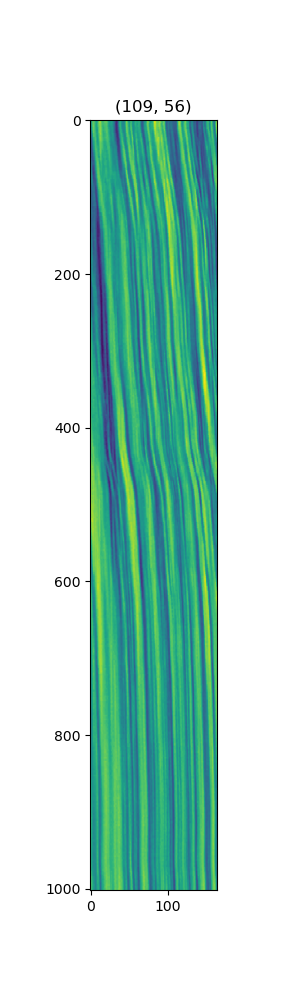

In [21]:
fig, ax = plt.subplots(figsize=(3,10))
ax.imshow(filtered_kymos[edge][1])
ax.set_title(str(edge))

In [22]:
speeds[edge]=speeds[edge][:,:300]
to_treat = (speeds[edge]-np.mean(speeds[edge]))/np.std(speeds[edge])
# corr = signal.correlate2d(to_treat, to_treat,mode='same')
# corr = corr/np.max(corr)

Text(0, 0.5, 'time')

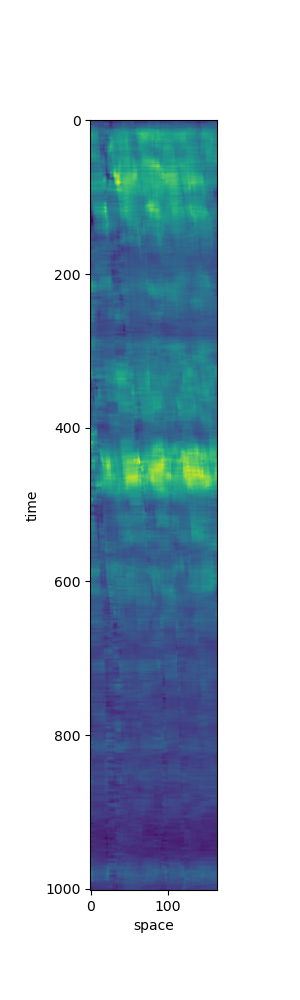

In [23]:
fig, ax = plt.subplots(figsize=(3,10))
ax.imshow(speeds[edge])
ax.set_xlabel('space')
ax.set_ylabel('time')

Text(0, 0.5, 'time')

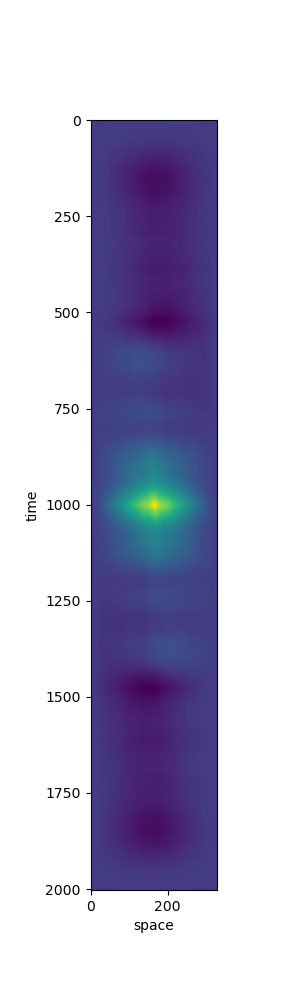

In [24]:
fig, ax = plt.subplots(figsize=(3,10))
ax.imshow(corrs[edge])
ax.set_xlabel('space')
ax.set_ylabel('time')

In [25]:
corr = corrs[edge]

In [26]:
length_edge = get_length_um_edge(edge,nx_graph_pruned,space_pixel_size)

Text(0, 0.5, 'correlation')

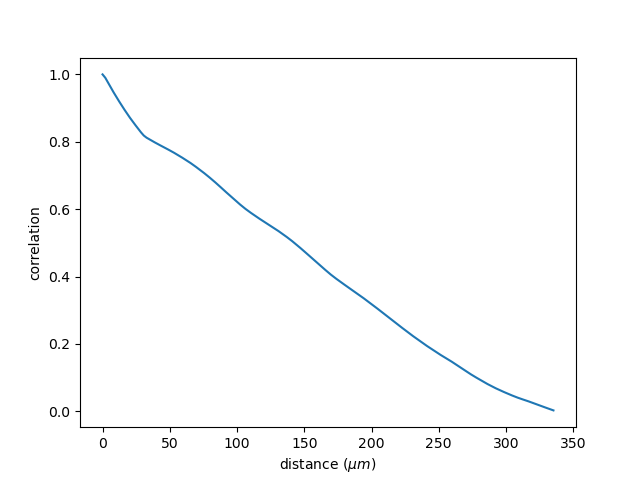

In [27]:
spatial_corr = corr[corr.shape[0]//2,corr.shape[1]//2:]
fig, ax = plt.subplots()
length_space= length_edge
xs = np.linspace(0,length_space/2,len(spatial_corr))
ax.plot(xs,spatial_corr)
ax.set_xlabel('distance ($\mu m$)')
ax.set_ylabel('correlation')

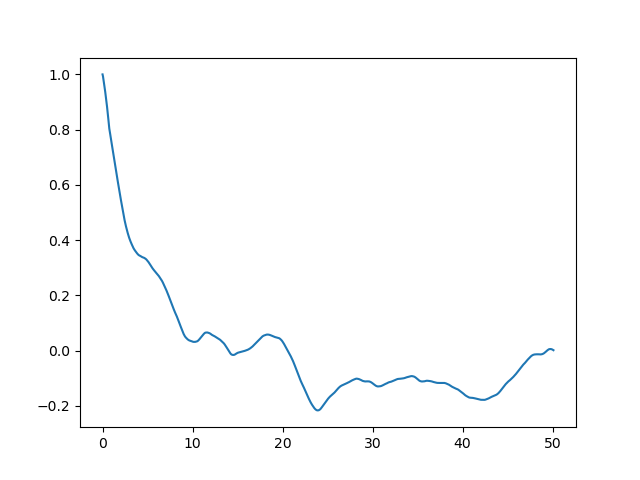

In [28]:
time_corr = corr[corr.shape[0]//2:,corr.shape[1]//2]
fig, ax = plt.subplots()
length_time= time_pixel_size*len(time_corr)
ts = np.linspace(0,length_time/2,len(time_corr))
ax.plot(ts,time_corr)

Text(0, 0.5, 'time_shift with the peak of correlation (s)')

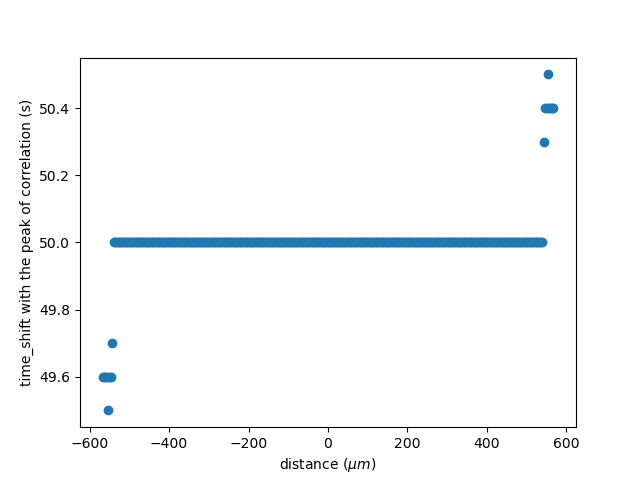

In [29]:
space_pixel_size = 1.725*2
fig, ax = plt.subplots()
max_time_corr = np.argmax(corr,axis=0)*time_pixel_size-length_time/2
length_space= space_pixel_size*len(max_time_corr)
xs = np.linspace(-length_space/2,length_space/2,len(max_time_corr))
plt.scatter(xs,max_time_corr)
# ax.set_ylim(-10,10)
ax.set_xlabel('distance ($\mu m)$')
ax.set_ylabel('time_shift with the peak of correlation (s)')

Text(0, 0.5, 'distance shift with the peak of correlation ($\\mu m$)')

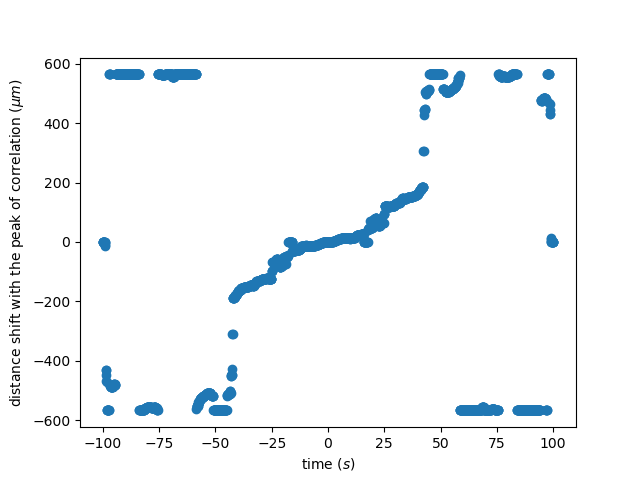

In [30]:
time_pixel_size = 0.1
fig, ax = plt.subplots()
max_space_corr = np.argmax(corr,axis=1)*space_pixel_size-length_space/2
length_time= time_pixel_size*len(max_space_corr)
ts = np.linspace(-length_time/2,length_time/2,len(max_space_corr))
plt.scatter(ts,max_space_corr)
ax.set_xlabel('time ($s)$')
ax.set_ylabel('distance shift with the peak of correlation ($\mu m$)')

In [31]:
np.mean(speeds[edge],axis=1)

array([0.6356058 , 0.69891614, 0.76280636, ..., 0.49860886, 0.42845714,
       0.4277799 ], dtype=float32)

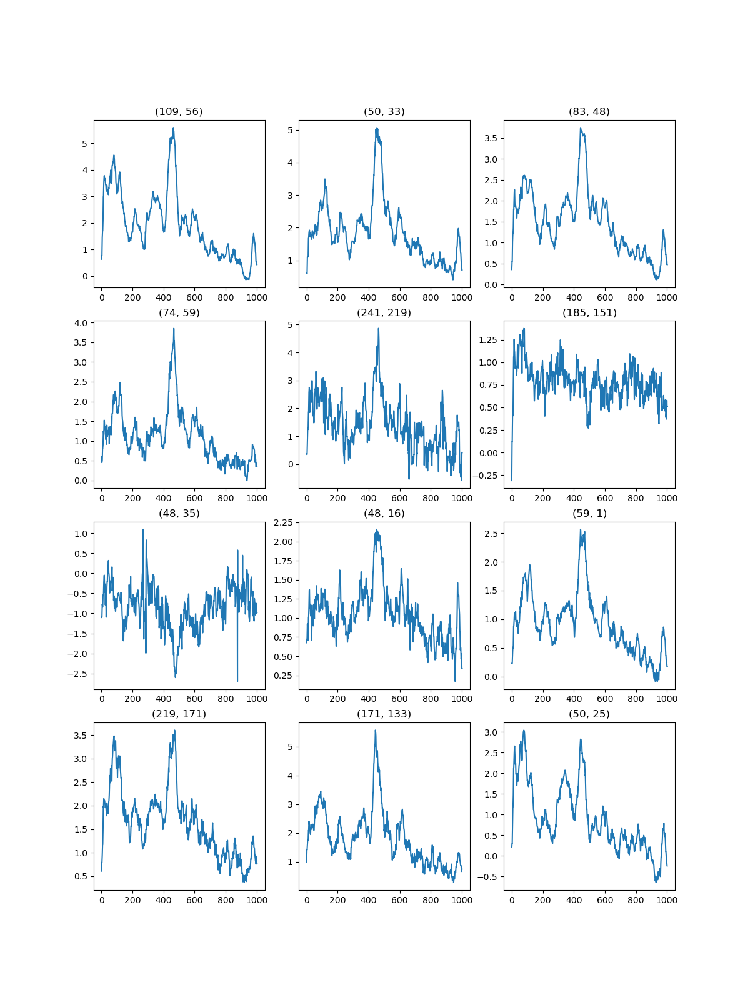

In [32]:
mean_speed = {edge:np.mean(speeds[edge],axis=1) for edge in edges}
fig,axs = gridplot(len(kymos),ncols = 3)
for i,ax in enumerate(axs):
    ax.plot(mean_speed[edges[i]])
    ax.set_title(str(edges[i]))
    # ax.set_ylim((0,-8.5))

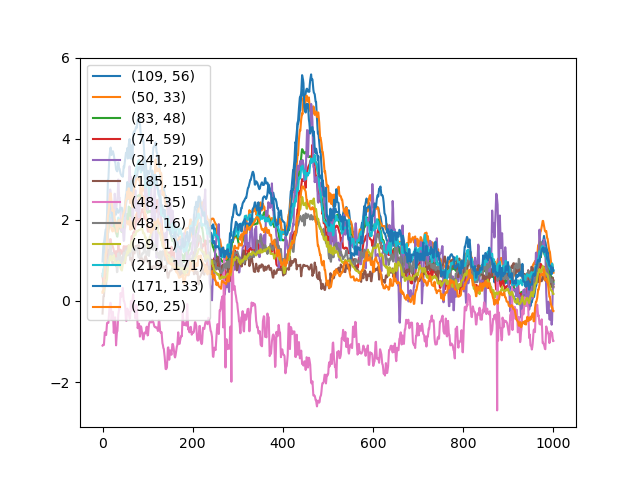

In [36]:
fig,ax = plt.subplots()
for edge in edges:
    ax.plot(mean_speed[edge],label=edge)
# ax.set_ylim(0,-10)
plt.legend()

In [129]:
cross_corrs={}
signal_compare = (mean_speed[(219,171)]-np.mean(mean_speed[(219,171)]))/(np.std(mean_speed[(219,171)]))
for edge in edges:
    signal_2 = (mean_speed[edge]-np.mean(mean_speed[edge]))/(np.std(mean_speed[edge]))

    cross_corrs[edge] = signal.correlate(signal_2,signal_compare)

In [48]:
cross_corrs[edge]

array([3313.1567], dtype=float32)

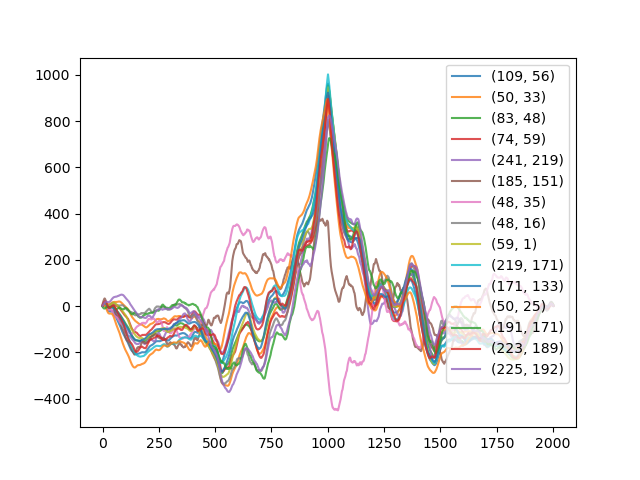

In [145]:
fig,ax = plt.subplots()
for edge in edges:
    time_corr = cross_corrs[edge]
    ts = np.linspace(0,length_time/2,len(time_corr))
    length_time= time_pixel_size*len(time_corr)
    ax.plot(time_corr,label=edge,alpha=0.8)


plt.legend()

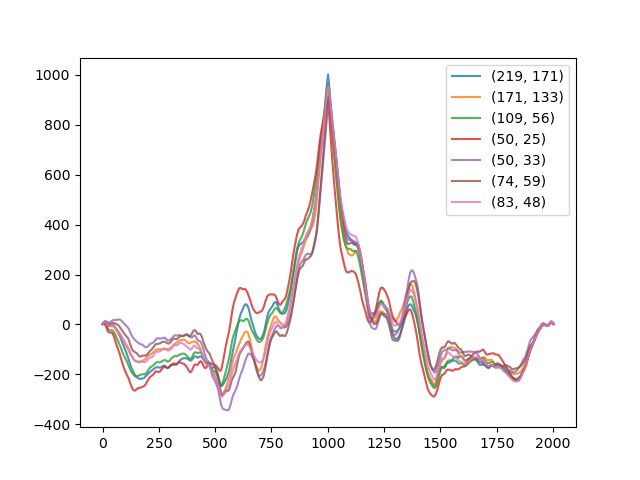

In [144]:
fig,ax = plt.subplots()
for edge in [(219,171),(171,133),(109,56),(50,25),(50,33),(74,59),(83,48)]:
    time_corr = cross_corrs[edge]
    ts = np.linspace(0,length_time/2,len(time_corr))
    length_time= time_pixel_size*len(time_corr)
    ax.plot(time_corr,label=edge,alpha=0.8)


plt.legend()

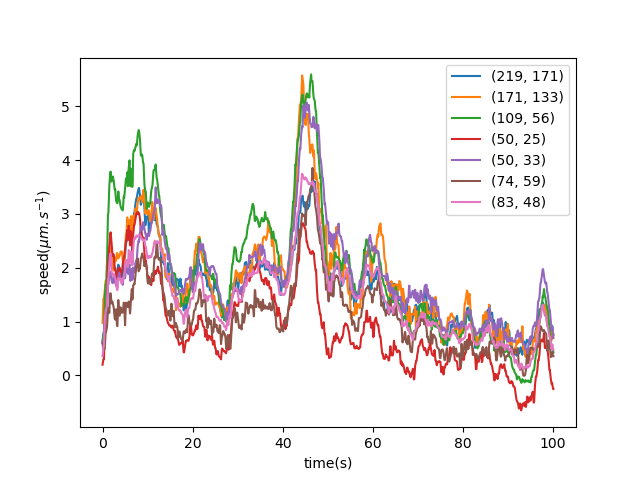

In [139]:

fig,ax = plt.subplots()
for edge in [(219,171),(171,133),(109,56),(50,25),(50,33),(74,59),(83,48)]:
    ax.plot(np.array(range(len(mean_speed[edge])))*time_pixel_size,mean_speed[edge],label=edge)
ax.set_xlabel('time(s)')
ax.set_ylabel('speed($\mu m.s^{-1}$)')
plt.legend()

Text(0, 0.5, 'speed($\\mu m.s^{-1}$)')

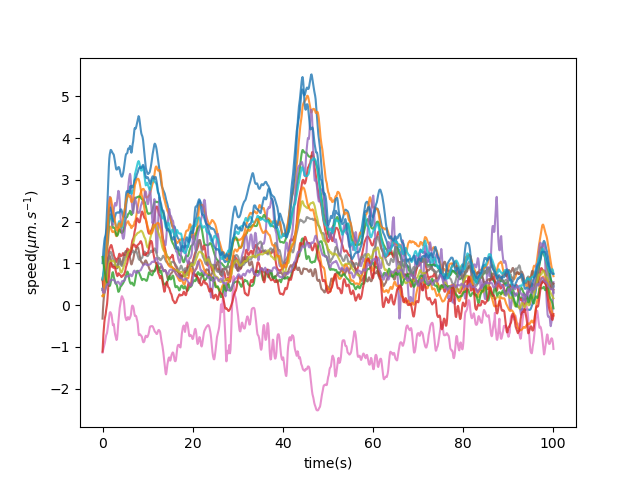

In [154]:
mean_speed = {edge:np.mean(speeds[edge],axis=1) for edge in edges}
mean_speed_smooth = {edge:scipy.signal.savgol_filter(np.mean(speeds[edge],axis=1),11,3) for edge in edges}

fig,ax = plt.subplots()
for edge in edges:
    ax.plot(np.array(range(len(mean_speed[edge])))*time_pixel_size,mean_speed_smooth[edge],label=edge,alpha=0.8)
ax.set_xlabel('time(s)')
ax.set_ylabel('speed($\mu m.s^{-1}$)')
# plt.legend()

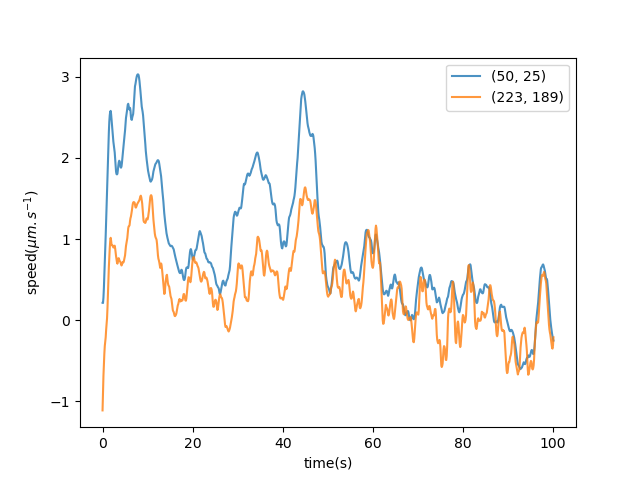

In [142]:
mean_speed = {edge:np.mean(speeds[edge],axis=1) for edge in edges}
mean_speed_smooth = {edge:scipy.signal.savgol_filter(np.mean(speeds[edge],axis=1),11,3) for edge in edges}

fig,ax = plt.subplots()
for edge in [(50,25),(223,189)]:
    ax.plot(np.array(range(len(mean_speed[edge])))*time_pixel_size,mean_speed_smooth[edge],label=edge,alpha=0.8)
ax.set_xlabel('time(s)')
ax.set_ylabel('speed($\mu m.s^{-1}$)')
plt.legend()

In [ ]:
for edge in [(219,171),(171,133),(109,56),(50,25),(50,33),(74,59),(83,48)]:
    print(edgemean_speed[edge],label=edge)

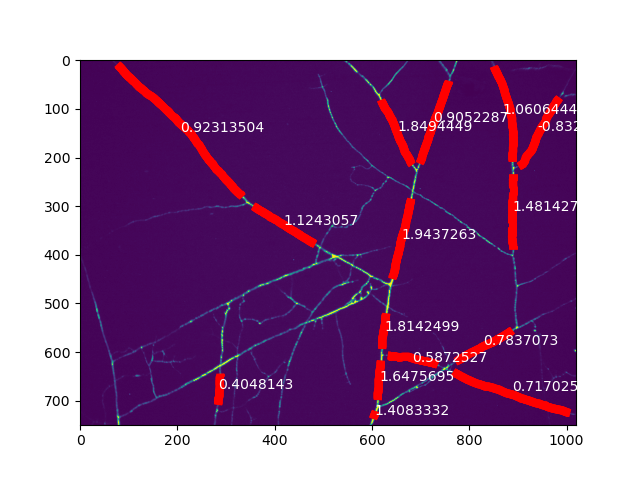

In [128]:
fig, ax = plt.subplots()
ax.imshow(image)
for edge in edges:
    slices, segments = extract_section_profiles_for_edge(
    edge,
    pos,
    image,
    nx_graph_pruned,
    resolution=1,
    offset=4,
    step=15,
    target_length=10,
)
    plot_segments_on_image(segments,ax)
    ax.text(*np.flip(np.mean([pos[edge[0]],pos[edge[1]]],axis=0)),np.mean(mean_speed[edge]),color="white")

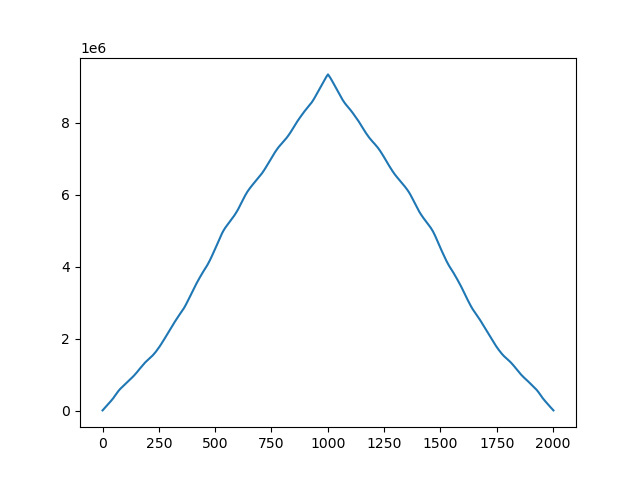

In [157]:
i=0
fig, ax = plt.subplots()
signal = 
ax.plot(signal.correlate(kymos[edges[i]][:,0],kymos[edges[i]][:,0]))
# ax.plot(signal.correlate(kymos[edges[i]][0,:],kymos[edges[i]][100,:]))
# ax.plot(signal.correlate(kymos[edges[i]][0,:],kymos[edges[i]][200,:]))